# Mapping Signal Groups

In [4]:
%load_ext autoreload
%autoreload 2
from skimage import filters
from IPython.display import Image, display
import imageio
import matplotlib.pyplot as plt
import xarray as xr
import zarr
import os
import pandas as pd
import numpy as np
from src.archive.transforms import PipelineRegistry

def load_source(path):# -> dict[Any, Dataset]:
    store = zarr.open(path)
    keys = list(store.keys())
    dt = {key: xr.open_zarr(path + '/'+ key) for key in keys}
    return dt
    

def make_channel_df(dataset):
    items = []
    for key, ds in dataset.data_vars.items():
        item = dict(name=ds.attrs['uda_name'], description=ds.attrs['description'])
        items.append(item)

    df = pd.DataFrame(items)
    return df

def make_gif(dataset, file_name: str):
    frames = dataset.data.values
    duration = (dataset.time.values.max() - dataset.time.values.min()) / len(frames)
    imageio.mimsave(file_name, frames, duration=duration, loop=0)

def plot_gif(file_name: str):
    with open(file_name, 'rb') as file:
        display(Image(data=file.read(), format='png'))

def print_datasets(dt):
    for key, ds in dt.items():
        print(ds.sizes, key, ds.attrs['description'])

pipelines = PipelineRegistry()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### ABM - Needs Review

In [5]:
source = 'abm'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 2MB
Dimensions:         (dim_0: 32, chord: 11, time: 7500)
Coordinates:
  * chord           (chord) float32 44B 1.0 2.0 3.0 4.0 ... 8.0 9.0 10.0 11.0
  * dim_0           (dim_0) float32 128B 1.0 2.0 3.0 4.0 ... 29.0 30.0 31.0 32.0
  * time            (time) float32 30kB -0.1 -0.0996 -0.0992 ... 2.899 2.899 2.9
Data variables: (12/21)
    calib_shot      int16 2B ...
    channel_status  (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    channel_type    (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    gain            (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    i-bol           (time, dim_0) float32 960kB dask.array<chunksize=(7500, 32), meta=np.ndarray>
    km              (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    ...              ...
    taum            (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    tco_emis        (time, chord) float32 330kB dask.array<chunksize=(7500, 11), meta=np.ndarray>
    v-bol           (time, dim_0) float32 960kB dask.array<chunksize=(7500, 32), meta=np.ndarray>
    version         float32 4B ...
    z-chords        (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
    z-slits         (dim_0) float32 128B dask.array<chunksize=(32,), meta=np.ndarray>
Attributes:
    description:  multi-chord bolometers
    file_name:    abm0304.20
    format:       IDA3
    mds_name:     None
    name:         abm
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       abm
    uda_name:     ABM
    uuid:         8a434405-caa4-5419-9078-cffeec67da68
    version:      0

### ADA

In [6]:
source = 'ada'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 8MB
Dimensions:             (time: 886, dim_0: 1155, dim_1: 1024)
Coordinates:
  * dim_0               (dim_0) float32 5kB 0.1837 0.1849 0.1862 ... 1.608 1.609
  * dim_1               (dim_1) float32 4kB -0.2456 -0.2447 ... 1.123 1.124
  * time                (time) float32 4kB -0.09717 -0.09512 ... 0.6941 0.6962
Data variables:
    dalpha_integrated   (time) float32 4kB dask.array<chunksize=(886,), meta=np.ndarray>
    dalpha_inverted     (time, dim_0) float32 4MB dask.array<chunksize=(886, 1155), meta=np.ndarray>
    dalpha_peak_radius  (time) float32 4kB dask.array<chunksize=(886,), meta=np.ndarray>
    dalpha_raw_full     (time, dim_1) float32 4MB dask.array<chunksize=(886, 1024), meta=np.ndarray>
    geo_full            (dim_1) float32 4kB dask.array<chunksize=(1024,), meta=np.ndarray>
    inner_integrated    (time) float32 4kB dask.array<chunksize=(886,), meta=np.ndarray>
    inner_peak_radius   (time) float32 4kB dask.array<chunksize=(886,), meta=np.ndarray>
    passnumber          float32 4B ...
    status              float32 4B ...
Attributes:
    description:  Linear D-Alpha Camera
    file_name:    ada0304.20
    format:       IDA3
    mds_name:     None
    name:         ada
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       ada
    uda_name:     ADA
    uuid:         3df71f88-c5bb-5584-9aee-25838a11b301
    version:      0

### ADG

In [76]:
source = 'adg'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/915556203.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 5kB
Dimensions:            (time: 388)
Coordinates:
  * time               (time) float32 2kB -0.09512 -0.09307 ... 0.6962 0.6982
Data variables:
    density_gradient   (time) float32 2kB dask.array<chunksize=(388,), meta=np.ndarray>
    gradient_position  (time) float32 2kB dask.array<chunksize=(388,), meta=np.ndarray>
    passnumber         float32 4B ...
    status             float32 4B ...
Attributes:
    description:  Plasma Edge Density gradient from the linear D-alpha camera
    file_name:    adg0304.20
    format:       IDA3
    mds_name:     None
    name:         adg
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       adg
    uda_name:     ADG
    uuid:         94583e44-ba3f-5051-92b9-8db0737694ce
    version:      0

### AGA

In [77]:
source = 'aga'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/6383710.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 13MB
Dimensions:         (time: 132812)
Coordinates:
  * time            (time) float32 531kB -2.5 -2.5 -2.5 -2.5 ... 10.2 10.2 10.2
Data variables: (12/25)
    bc11            (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    bc5             (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    fig             (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    fig_raw         (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    hecc            (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    helios          (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    ...              ...
    outboard_total  (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    passnumber      int32 4B ...
    status          int32 4B ...
    tc11            (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    tc5a            (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
    tc5b            (time) float32 531kB dask.array<chunksize=(132812,), meta=np.ndarray>
Attributes:
    description:  molecular deuterium pressure, neutral gas pressure, Gas Inj...
    file_name:    aga0304.20
    format:       IDA3
    mds_name:     None
    name:         aga
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       aga
    uda_name:     AGA
    uuid:         5a93f101-c97b-540a-9d47-ca66de895ce3
    version:      0

### AHX

In [78]:
source = 'ahx'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/2352090893.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 240kB
Dimensions:     (time: 15000)
Coordinates:
  * time        (time) float32 60kB -0.1 -0.0999 -0.0998 -0.0997 ... 1.4 1.4 1.4
Data variables:
    hxr_mezzw   (time) float32 60kB dask.array<chunksize=(15000,), meta=np.ndarray>
    hxr_s       (time) float32 60kB dask.array<chunksize=(15000,), meta=np.ndarray>
    hxr_w       (time) float32 60kB dask.array<chunksize=(15000,), meta=np.ndarray>
    passnumber  float32 4B ...
    status      float32 4B ...
    version     float32 4B ...
Attributes:
    description:  Hard X-rays
    file_name:    ahx0304.20
    format:       IDA3
    mds_name:     None
    name:         ahx
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       ahx
    uda_name:     AHX
    uuid:         36843196-5cf2-5b70-a053-51cb1fc838ec
    version:      0

### AIM

In [22]:
source = 'aim'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 1MB
Dimensions:          (time: 50000)
Coordinates:
  * time             (time) float32 200kB -0.01 -0.00998 -0.00996 ... 0.99 0.99
Data variables:
    da_hm10_t        (time) float32 200kB dask.array<chunksize=(50000,), meta=np.ndarray>
    da_hm10_t_error  (time) float32 200kB dask.array<chunksize=(50000,), meta=np.ndarray>
    da_to10          (time) float32 200kB dask.array<chunksize=(50000,), meta=np.ndarray>
    da_to10_error    (time) float32 200kB dask.array<chunksize=(50000,), meta=np.ndarray>
    passnumber       int32 4B dask.array<chunksize=(), meta=np.ndarray>
    status           int32 4B dask.array<chunksize=(), meta=np.ndarray>

### AIR

In [81]:
source = 'air'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/4011811044.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 11MB
Dimensions:              (dim_0: 299, time: 3120)
Coordinates:
  * dim_0                (dim_0) float32 1kB 0.8 0.8016 0.8032 ... 1.269 1.271
  * time                 (time) float32 12kB -0.04998 -0.04978 ... 0.4086 0.4088
Data variables: (12/30)
    alphaconst_osp       float32 4B ...
    alphaconst_osp_elm   float32 4B ...
    camera_view_osp      float32 4B ...
    etot_osp             (time) float32 12kB dask.array<chunksize=(3120,), meta=np.ndarray>
    etot_osp_elm         (time) float32 12kB dask.array<chunksize=(3120,), meta=np.ndarray>
    etotsum_osp          (time) float32 12kB dask.array<chunksize=(3120,), meta=np.ndarray>
    ...                   ...
    status               float32 4B ...
    svn_revision         float32 4B ...
    temperature_osp      (time) float32 12kB dask.array<chunksize=(3120,), meta=np.ndarray>
    tprofile_osp         (time, dim_0) float32 4MB dask.array<chunksize=(3120, 299), meta=np.ndarray>
    z_extent_osp         float32 4B ...
    z_start_osp          float32 4B ...
Attributes:
    description:  IR Camera, IR Temperature Reference thermocouples
    file_name:    air0304.20
    format:       IDA3
    mds_name:     None
    name:         air
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       air
    uda_name:     AIR
    uuid:         25edd92e-1378-54ad-8ce1-cf09df251ab8
    version:      0

### AIT

In [82]:
source = 'ait'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/4060667584.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 17MB
Dimensions:              (dim_0: 214, time: 3161)
Coordinates:
  * dim_0                (dim_0) float32 856B 0.8 0.8063 0.8126 ... 1.815 1.82
  * time                 (time) float32 13kB -0.04995 -0.04975 ... 0.4087 0.4089
Data variables: (12/57)
    alphaconst_isp       float32 4B ...
    alphaconst_isp_elm   float32 4B ...
    alphaconst_osp       float32 4B ...
    alphaconst_osp_elm   float32 4B ...
    camera_view_isp      float32 4B ...
    camera_view_osp      float32 4B ...
    ...                   ...
    tprofile_isp         (time, dim_0) float32 3MB dask.array<chunksize=(3161, 214), meta=np.ndarray>
    tprofile_osp         (time, dim_0) float32 3MB dask.array<chunksize=(3161, 214), meta=np.ndarray>
    z_extent_isp         float32 4B ...
    z_extent_osp         float32 4B ...
    z_start_isp          float32 4B ...
    z_start_osp          float32 4B ...
Attributes:
    description:  IR Camera
    file_name:    ait0304.20
    format:       IDA3
    mds_name:     None
    name:         ait
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       ait
    uda_name:     AIT
    uuid:         cd0e985b-a11f-59ec-b625-28a370fc6d49
    version:      0

### ALP - needs review

In [83]:
source = 'alp'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset
# print_datasets(dataset)
# for key, ds in dataset.items():
#     print(ds.coords)


/tmp/ipykernel_6672/2521670961.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 3MB
Dimensions:                    (time: 288, npts_inner: 32, npts_outer: 64)
Coordinates:
  * time                       (time) float32 1kB 0.1504 0.1514 ... 0.4489
Dimensions without coordinates: npts_inner, npts_outer
Data variables: (12/105)
    badamps                    float32 4B ...
    inner_lo_chisq             (time, npts_inner) float32 37kB dask.array<chunksize=(288, 32), meta=np.ndarray>
    inner_lo_denpeakval        (time) float32 1kB dask.array<chunksize=(288,), meta=np.ndarray>
    inner_lo_density           (time, npts_inner) float32 37kB dask.array<chunksize=(288, 32), meta=np.ndarray>
    inner_lo_density_error     (time, npts_inner) float32 37kB dask.array<chunksize=(288, 32), meta=np.ndarray>
    inner_lo_jsapeakpos        (time) float32 1kB dask.array<chunksize=(288,), meta=np.ndarray>
    ...                         ...
    outer_up_timemid           (time, npts_outer) float32 74kB dask.array<chunksize=(288, 64), meta=np.ndarray>
    outer_up_vfloat            (time, npts_outer) float32 74kB dask.array<chunksize=(288, 64), meta=np.ndarray>
    outer_up_vfloat_error      (time, npts_outer) float32 74kB dask.array<chunksize=(288, 64), meta=np.ndarray>
    outer_up_z                 (npts_outer) float32 256B dask.array<chunksize=(64,), meta=np.ndarray>
    passnumber                 float32 4B ...
    status                     float32 4B ...
Attributes:
    description:  Langmuir Probe
    file_name:    alp0304.20
    format:       IDA3
    mds_name:     None
    name:         alp
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       alp
    uda_name:     ALP
    uuid:         6e90b3e9-7ec8-594c-8789-2bbf14a556b5
    version:      0

### AMA

In [84]:
source = 'ama'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/660659790.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 18MB
Dimensions:          (time: 650000)
Coordinates:
  * time             (time) float32 3MB -0.1 -0.1 -0.1 -0.09999 ... 1.2 1.2 1.2
Data variables:
    n=2_amplitude    (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    n=2_frequency    (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    n=2_signal       (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    n=odd_amplitude  (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    n=odd_frequency  (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    n=odd_signal     (time) float32 3MB dask.array<chunksize=(650000,), meta=np.ndarray>
    passnumber       float32 4B ...
    status           float32 4B ...
    version          float32 4B ...
Attributes:
    description:  Magnetic Field Measurements: Analysis of Centre Column Toro...
    file_name:    ama0304.20
    format:       IDA3
    mds_name:     None
    name:         ama
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       ama
    uda_name:     AMA
    uuid:         5e447e91-a1c5-5597-b0c5-03af65abe4e9
    version:      0

### AMB - Needs Review

AMB needs further tensorising to combine channels. Also requires including mapping r and z coordinates

/tmp/ipykernel_6672/681441263.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


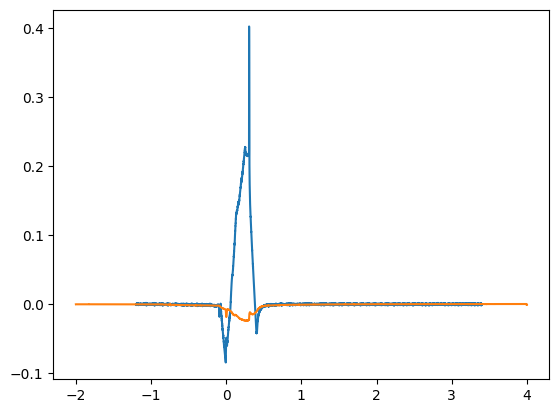

In [85]:
source = 'amb'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

ds = dataset['ccbv'].dropna(dim='time')
plt.plot(ds.time, ds.values[0])

ds = dataset['obv'].dropna(dim='time')
plt.plot(ds.time, ds.values[0])

### AMC - Needs Review

In [86]:
source = 'amc'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

# df = make_channel_df(dataset)
# df.to_csv('amc.csv')

/tmp/ipykernel_6672/2795289470.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 5MB
Dimensions:            (time: 30000)
Coordinates:
  * time               (time) float32 120kB -2.0 -2.0 -2.0 ... 3.999 4.0 4.0
Data variables: (12/46)
    efps_current       (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    error_field_02     (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    error_field_05     (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    p2il_coil_current  (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    p2il_feed_current  (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    p2iu_coil_current  (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    ...                 ...
    p6u_current        (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    plasma_current     (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    sol_current        (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    status             float32 4B ...
    tf_current         (time) float32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    version            float32 4B ...
Attributes:
    description:  Plasma Current and PF/TF Coil Currents
    file_name:    amc0304.20
    format:       IDA3
    mds_name:     None
    name:         amc
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       amc
    uda_name:     AMC
    uuid:         01aad0c4-2a84-59e2-8b1b-168b4bd66aa3
    version:      0

Text(0.5, 1.0, 'Plasma Current for shot 30420')

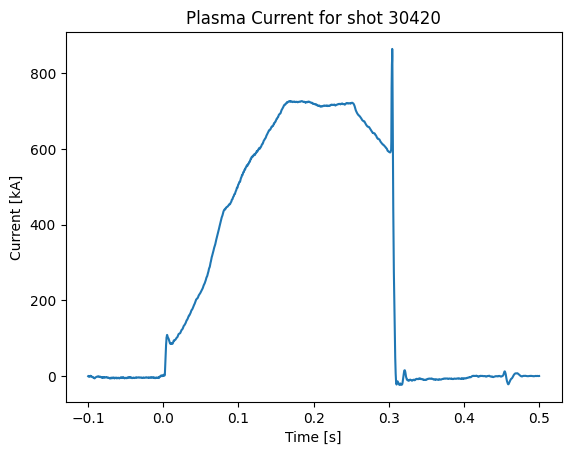

In [87]:
current = dataset['plasma_current']
current = current.isel(time=current.time < .5)
current = current.isel(time=current.time > -.1)

plt.plot(current.time, current)
plt.xlabel(f"Time [{current.time.attrs['units']}]")
plt.ylabel(f"Current [{current.attrs['units']}]")
plt.title(f"Plasma Current for shot {current.attrs['shot_id']}")

### AMH - Needs Review

AMH also needs further tensorising, but we should check with Lucy about groups.

In [88]:
source = 'amh'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

# df = make_channel_df(dataset)
# df.to_csv('amh.csv')

/tmp/ipykernel_6672/1472096944.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 537kB
Dimensions:              (time: 2200)
Coordinates:
  * time                 (time) float32 9kB 0.289 0.289 0.289 ... 0.329 0.329
Data variables: (12/63)
    halo_ccu_2           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    halo_p2l_1           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    halo_p2l_2           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    halo_p2l_3           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    halo_p2l_4           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    halo_p2l_5           (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    ...                   ...
    phalo_sum_p2l_inner  (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    phalo_sum_p2l_outer  (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    phalo_sum_p2u_inner  (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    phalo_sum_p2u_outer  (time) float32 9kB dask.array<chunksize=(2200,), meta=np.ndarray>
    status               float32 4B ...
    version              float32 4B ...
Attributes:
    description:  Halo current Measurements (HAL), P2/P3 Halo Current Measure...
    file_name:    amh0304.20
    format:       IDA3
    mds_name:     None
    name:         amh
    quality:      Bad
    shot_id:      30420
    signal_type:  Analysed
    source:       amh
    uda_name:     AMH
    uuid:         b183d6f1-befe-5843-84da-67e4bf82acbc
    version:      0

### AMM - Needs Review

Another source that can be hevily tensorized

In [90]:
source = 'amm'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

# df = make_channel_df(dataset)
# df.to_csv('amm.csv')

/tmp/ipykernel_6672/305250279.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 19MB
Dimensions:        (time: 30000, incon_channel: 10, lhorw_channel: 6,
                    mid_channel: 12, ring_channel: 10, rodgr_channel: 12,
                    uhorw_channel: 6, vertw_channel: 8)
Coordinates:
  * incon_channel  (incon_channel) <U7 280B 'incon1' 'incon2' ... 'incon10'
  * lhorw_channel  (lhorw_channel) <U6 144B 'lhorw1' 'lhorw2' ... 'lhorw6'
  * mid_channel    (mid_channel) <U5 240B 'mid1' 'mid2' ... 'mid11' 'mid12'
  * ring_channel   (ring_channel) <U6 240B 'ring1' 'ring2' ... 'ring9' 'ring10'
  * rodgr_channel  (rodgr_channel) <U7 336B 'rodgr1' 'rodgr2' ... 'rodgr12'
  * time           (time) float32 120kB -2.0 -2.0 -2.0 ... 4.0 4.001 4.001
  * uhorw_channel  (uhorw_channel) <U6 144B 'uhorw1' 'uhorw2' ... 'uhorw6'
  * vertw_channel  (vertw_channel) <U6 192B 'vertw1' 'vertw2' ... 'vertw8'
Data variables: (12/25)
    botcol         (time) float64 240kB dask.array<chunksize=(30000,), meta=np.ndarray>
    endcrown_l     (time) float64 240kB dask.array<chunksize=(30000,), meta=np.ndarray>
    endcrown_u     (time) float64 240kB dask.array<chunksize=(30000,), meta=np.ndarray>
    incon          (incon_channel, time) float64 2MB dask.array<chunksize=(10, 30000), meta=np.ndarray>
    lhorw          (lhorw_channel, time) float64 1MB dask.array<chunksize=(6, 30000), meta=np.ndarray>
    mid            (mid_channel, time) float64 3MB dask.array<chunksize=(12, 30000), meta=np.ndarray>
    ...             ...
    substeps       (time) int32 120kB dask.array<chunksize=(30000,), meta=np.ndarray>
    tcutoff        float64 8B ...
    tolerance      float64 8B ...
    topcol         (time) float64 240kB dask.array<chunksize=(30000,), meta=np.ndarray>
    uhorw          (uhorw_channel, time) float64 1MB dask.array<chunksize=(6, 30000), meta=np.ndarray>
    vertw          (vertw_channel, time) float64 2MB dask.array<chunksize=(8, 30000), meta=np.ndarray>
Attributes:
    description:  Output from EFIT's wall model: calculated induced currents ...
    file_name:    amm0304.20
    format:       IDA3
    mds_name:     None
    name:         amm
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       amm
    uda_name:     AMM
    uuid:         d0b7e413-69f1-5e78-97b4-39ad11f1a9bf
    version:      0

### AMS

In [91]:
source = 'ams'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/2395906715.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 505MB
Dimensions:                 (dim_0: 2219, dim_1: 30, time: 2366)
Coordinates:
  * dim_0                   (dim_0) float32 9kB 0.0 1.0 ... 2.217e+03 2.218e+03
  * dim_1                   (dim_1) float32 120B 0.0 1.0 2.0 ... 27.0 28.0 29.0
  * time                    (time) float32 9kB -0.047 -0.0465 ... 0.597 0.5975
Data variables: (12/57)
    acoeff                  (dim_0, dim_1) float32 266kB dask.array<chunksize=(2219, 30), meta=np.ndarray>
    beam_ok                 float32 4B ...
    ch                      (dim_0) float32 9kB dask.array<chunksize=(2219,), meta=np.ndarray>
    cosbeam                 (dim_0) float32 9kB dask.array<chunksize=(2219,), meta=np.ndarray>
    cpf                     (time, dim_0) float32 21MB dask.array<chunksize=(2366, 2219), meta=np.ndarray>
    cpf_error               (time, dim_0) float32 21MB dask.array<chunksize=(2366, 2219), meta=np.ndarray>
    ...                      ...
    status                  int32 4B ...
    trans                   (dim_0) float32 9kB dask.array<chunksize=(2219,), meta=np.ndarray>
    version                 float32 4B ...
    viewstr                 (dim_0) float32 9kB dask.array<chunksize=(2219,), meta=np.ndarray>
    vx0                     (dim_0, dim_1) float32 266kB dask.array<chunksize=(2219, 30), meta=np.ndarray>
    vy0                     (dim_0, dim_1) float32 266kB dask.array<chunksize=(2219, 30), meta=np.ndarray>
Attributes:
    description:  Multi-channel MSE
    file_name:    ams0303.97
    format:       IDA3
    mds_name:     None
    name:         ams
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       ams
    uda_name:     AMS
    uuid:         93f00af6-646d-5dbf-bc4b-f4082969b0da
    version:      0

### ANB

In [92]:
source = 'anb'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/3306943009.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 8MB
Dimensions:               (time: 99921)
Coordinates:
  * time                  (time) float64 799kB -0.5 -0.5 -0.4999 ... 2.0 2.0 2.0
Data variables: (12/20)
    passnumber            int32 4B ...
    ss_full_power         (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    ss_full_power_error   (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    ss_half_power         (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    ss_half_power_error   (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    ss_sum_power          (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    ...                    ...
    sw_sum_power          (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    sw_sum_power_error    (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    sw_third_power        (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    sw_third_power_error  (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    tot_sum_power         (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
    tot_sum_power_error   (time) float32 400kB dask.array<chunksize=(99921,), meta=np.ndarray>
Attributes:
    description:  Neutral Beam Injection data
    file_name:    anb0303.97
    format:       IDA3
    mds_name:     None
    name:         anb
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       anb
    uda_name:     ANB
    uuid:         1014bccb-b858-5c7b-aee5-d7f7b89aeb81
    version:      0

### ANE

In [132]:
source = 'ane'
path = f'/common/tmp/sjackson/local_cache2/30420.zarr/{source}'
dataset = xr.open_zarr(path)
dataset


/tmp/ipykernel_6672/4087638451.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 524kB
Dimensions:        (time: 32768)
Coordinates:
  * time           (time) float32 131kB -0.01 -0.00996 -0.00992 ... 1.301 1.301
Data variables:
    co2            (time) float32 131kB dask.array<chunksize=(32768,), meta=np.ndarray>
    density        (time) float32 131kB dask.array<chunksize=(32768,), meta=np.ndarray>
    hene           (time) float32 131kB dask.array<chunksize=(32768,), meta=np.ndarray>
    passnumber     float32 4B ...
    status         float32 4B ...
    status_detail  float32 4B ...
    version        float32 4B ...
Attributes:
    description:  CO2 Interferometry
    file_name:    ane0304.20
    format:       IDA3
    mds_name:     None
    name:         ane
    quality:      Not Checked
    shot_id:      30420
    signal_type:  Analysed
    source:       ane
    uda_name:     ANE
    uuid:         5f814dd8-7336-56d7-a1ea-bac62e5cdcd3
    version:      0

### ANT

In [98]:
source = 'ant'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset


/tmp/ipykernel_6672/1934396220.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 16B
Dimensions:       ()
Data variables:
    neutron_dose  float32 4B ...
    passnumber    float32 4B ...
    status        float32 4B ...
    version       float32 4B ...
Attributes:
    description:  Neutron Dose
    file_name:    ant0303.97
    format:       IDA3
    mds_name:     None
    name:         ant
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       ant
    uda_name:     ANT
    uuid:         c02ae64b-dfe9-52f7-9f1a-888b7ee99b53
    version:      0

### ANU

In [99]:
source = 'anu'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/1251111175.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 5MB
Dimensions:         (time: 194512)
Coordinates:
  * time            (time) float32 778kB -0.1025 -0.1 -0.09999 ... 1.388 1.393
Data variables:
    errors          (time) float32 778kB dask.array<chunksize=(194512,), meta=np.ndarray>
    neutrons        (time) float32 778kB dask.array<chunksize=(194512,), meta=np.ndarray>
    neutrons_cb     (time) float32 778kB dask.array<chunksize=(194512,), meta=np.ndarray>
    neutrons_count  (time) float32 778kB dask.array<chunksize=(194512,), meta=np.ndarray>
    neutrons_dc     (time) float32 778kB dask.array<chunksize=(194512,), meta=np.ndarray>
    passnumber      float32 4B ...
    status          float32 4B ...
    version         float32 4B ...
Attributes:
    description:  Neutrons
    file_name:    anu0303.97
    format:       IDA3
    mds_name:     None
    name:         anu
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       anu
    uda_name:     ANU
    uuid:         9b710b29-1ef8-55bc-971f-3ed9c5cf811d
    version:      0

### AOE - Needs Review

Requires further work! Time ranges are different!

In [101]:
source = 'aoe'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/1224662746.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 30MB
Dimensions:     (time: 757862)
Coordinates:
  * time        (time) float32 3MB 2.384e-07 2.238e-06 ... 0.5243 0.5243
Data variables:
    co2_frac    (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    fast_k      (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    fast_ka     (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    fast_sync   (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    fast_u      (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    k_band      (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    ka_band     (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    passnumber  float32 4B ...
    ramping     (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    status      float32 4B ...
    u_band      (time) float32 3MB dask.array<chunksize=(757862,), meta=np.ndarray>
    version     float32 4B ...
Attributes:
    description:  IST Reflectometer
    file_name:    aoe0303.97
    format:       IDA3
    mds_name:     None
    name:         aoe
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       aoe
    uda_name:     AOE
    uuid:         d2acfca7-96b2-558d-bd44-063ca22b47c6
    version:      0

### ARP

In [102]:
source = 'arp'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/378457931.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 2MB
Dimensions:      (time: 177304)
Coordinates:
  * time         (time) float32 709kB 0.15 0.15 0.15 ... 0.2914 0.2914 0.2914
Data variables:
    passnumber   float32 4B ...
    rp_gap_efit  (time) float32 709kB dask.array<chunksize=(177304,), meta=np.ndarray>
    rp_radius    (time) float32 709kB dask.array<chunksize=(177304,), meta=np.ndarray>
    status       float32 4B ...
Attributes:
    description:  Reciprocating Probe
    file_name:    arp0303.97
    format:       IDA3
    mds_name:     None
    name:         arp
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       arp
    uda_name:     ARP
    uuid:         9a6d57e8-4d84-5db9-b484-b7734cbfba4c
    version:      0

### ASB

In [103]:
source = 'asb'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/531739116.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 636B
Dimensions:       (time: 52)
Coordinates:
  * time          (time) float32 208B -0.015 0.002204 0.01941 ... 0.8452 0.8624
Data variables:
    cii_dga       (time) float32 208B dask.array<chunksize=(52,), meta=np.ndarray>
    oii_dga       (time) float32 208B dask.array<chunksize=(52,), meta=np.ndarray>
    passnumber    int32 4B ...
    status        int32 4B ...
    svn_revision  float32 4B ...
Attributes:
    description:  D-alpha emission and other spectral lines
    file_name:    asb0303.97
    format:       IDA3
    mds_name:     None
    name:         asb
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       asb
    uda_name:     ASB
    uuid:         79357e85-023f-591a-b0fb-8796dc642ad3
    version:      0

### ASM - Needs Review
Another one which needs to be tensorized

In [104]:
source = 'asm'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset
# df = make_channel_df(dataset)
# df.to_csv('asm.csv')

/tmp/ipykernel_6672/3841051880.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 3MB
Dimensions:              (time: 32163, sad_m_channel: 11)
Coordinates:
  * sad_m_channel        (sad_m_channel) <U8 352B 'sad_m01' ... 'sad_m012'
  * time                 (time) float32 129kB -2.0 -2.0 -2.0 ... 4.0 4.001 4.001
Data variables: (12/16)
    hm_periods           (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    hm_rating            (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    out_nn_pattern       (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    out_nn_rating        (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    out_rating           (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    out_signal           (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    ...                   ...
    sad_d02_2-8          (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    sad_d03_4-10         (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    sad_d04_5-11         (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    sad_d05_6-12         (time) float32 129kB dask.array<chunksize=(32163,), meta=np.ndarray>
    sad_m                (sad_m_channel, time) float32 1MB dask.array<chunksize=(11, 32163), meta=np.ndarray>
    status               float32 4B ...
Attributes:
    description:  H-mode and locked mode detector, Outer Saddle Magnetic Coil...
    file_name:    asm0303.97
    format:       IDA3
    mds_name:     None
    name:         asm
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       asm
    uda_name:     ASM
    uuid:         bd50e5ec-1be0-523b-9f15-7bec0626d027
    version:      0

### ASX - Needs Review

Time has two values, but these differ between variables.

In [106]:
source = 'asx'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/2167650289.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 80B
Dimensions:              (npts: 2)
Dimensions without coordinates: npts
Data variables:
    elm_freqs            (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    elmy                 (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    large_scale          (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    lower_false_inv_rad  (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    modes                (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    passnumber           int32 4B ...
    sawteeth             (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    sawtooth_periods     (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    status               int32 4B ...
    up_cam_nos_sawt_inv  (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    upper_false_inv_rad  (npts) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
Attributes:
    description:  Automatic analysis of soft X-rays, sawtooth
    file_name:    asx0303.97
    format:       IDA3
    mds_name:     None
    name:         asx
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       asx
    uda_name:     ASX
    uuid:         a1ff2e5f-3902-58d2-82fd-67fac3f402af
    version:      0

### AYC

In [107]:
source = 'ayc'
path = f'/common/tmp/sjackson/local_cache2/29790.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/251954800.py:4: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 3MB
Dimensions:              (time: 174, arb: 130, radial_index: 130,
                          spectral_index: 4)
Coordinates:
  * arb                  (arb) float32 520B 0.0 1.0 2.0 ... 127.0 128.0 129.0
  * radial_index         (radial_index) float32 520B 1.0 2.0 3.0 ... 129.0 130.0
  * spectral_index       (spectral_index) float32 16B 1.0 2.0 3.0 4.0
  * time                 (time) float32 696B 0.0 1.02e-05 0.00417 ... 85.0 86.0
Data variables: (12/37)
    acqiris_time         (time) float32 696B dask.array<chunksize=(174,), meta=np.ndarray>
    angle                (arb) float32 520B dask.array<chunksize=(130,), meta=np.ndarray>
    aspectra             (time, radial_index, spectral_index) float32 362kB dask.array<chunksize=(174, 130, 4), meta=np.ndarray>
    chi2                 (time, radial_index) float32 90kB dask.array<chunksize=(174, 130), meta=np.ndarray>
    covariance_ne_te     (time, radial_index) float32 90kB dask.array<chunksize=(174, 130), meta=np.ndarray>
    instrument_dr        (time, radial_index) float32 90kB dask.array<chunksize=(174, 130), meta=np.ndarray>
    ...                   ...
    time_                (time) float32 696B dask.array<chunksize=(174,), meta=np.ndarray>
    version_fibre        float32 4B ...
    version_poly         float32 4B ...
    version_raman        float32 4B ...
    xyc_time             (time) float32 696B dask.array<chunksize=(174,), meta=np.ndarray>
    yag_nelint           (time) float32 696B dask.array<chunksize=(174,), meta=np.ndarray>
Attributes:
    description:  Core Thomson scattering data
    file_name:    ayc0297.90
    format:       IDA3
    mds_name:     None
    name:         ayc
    quality:      Not Checked
    shot_id:      29790
    signal_type:  Analysed
    source:       ayc
    uda_name:     AYC
    uuid:         a991f3ce-bc05-5366-b55b-3c072a3ca904
    version:      0

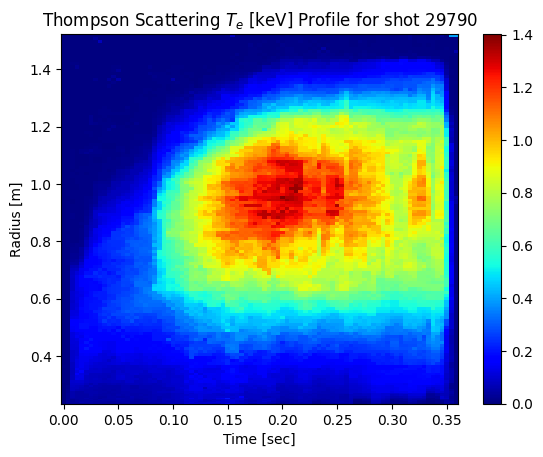

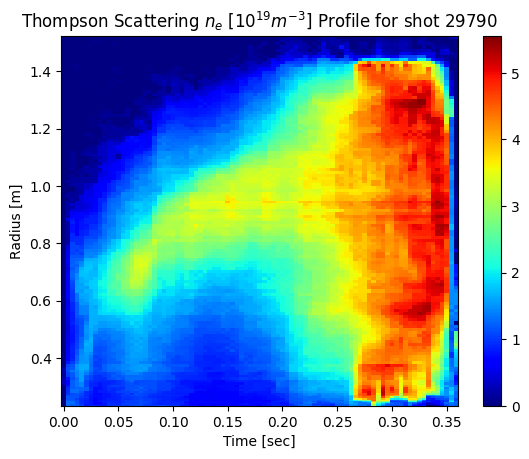

In [108]:
from skimage.morphology import disk
te = dataset['te'].T
te.values = te.values / 1000
te = te.fillna(0)
te.values = filters.median(te.values, footprint=disk(1))

ne = dataset['ne'].T
ne = ne.fillna(0)
ne.values = ne.values / 1e19
ne.values = filters.median(ne.values, footprint=disk(1))

r = dataset.r.dropna(dim='time')
te = te.sel(time=r.time)
ne = ne.sel(time=r.time)
time = te.time
angle = r.values[0]#dataset['angle']

time, angle = np.meshgrid(time, angle)

fig, ax = plt.subplots()
plt.pcolormesh(time, angle, te, cmap='jet')
ax.set_xlabel('Time [sec]')
ax.set_ylabel('Radius [m]')
ax.set_title(f"Thompson Scattering $T_e$ [keV] Profile for shot {te.attrs['shot_id']}")
plt.colorbar()

fig, ax = plt.subplots()
plt.pcolormesh(time, angle, ne, cmap='jet')
ax.set_xlabel('Time [sec]')
ax.set_ylabel('Radius [m]')
ax.set_title("Thompson Scattering $n_e$ [$10^{19} m^{-3}$]" + f" Profile for shot {ne.attrs['shot_id']}")
plt.colorbar()

### AYE

In [110]:
source = 'aye'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/2895452325.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 348kB
Dimensions:              (arb: 16, time: 138, radial_index: 16,
                          spectral_index: 4)
Coordinates:
  * arb                  (arb) float32 64B 0.0 1.0 2.0 3.0 ... 13.0 14.0 15.0
  * radial_index         (radial_index) float32 64B 1.0 2.0 3.0 ... 15.0 16.0
  * spectral_index       (spectral_index) float32 16B 1.0 2.0 3.0 4.0
  * time                 (time) float32 552B 0.0 0.00416 0.00832 ... 67.0 68.0
Data variables: (12/32)
    angle                (arb) float32 64B dask.array<chunksize=(16,), meta=np.ndarray>
    aspectra             (time, radial_index, spectral_index) float32 35kB dask.array<chunksize=(138, 16, 4), meta=np.ndarray>
    chi2                 (time, radial_index) float32 9kB dask.array<chunksize=(138, 16), meta=np.ndarray>
    covariance_ne_te     (time, radial_index) float32 9kB dask.array<chunksize=(138, 16), meta=np.ndarray>
    gauss_amplitude      (time, radial_index, spectral_index) float32 35kB dask.array<chunksize=(138, 16, 4), meta=np.ndarray>
    gauss_dclevel        (time, radial_index, spectral_index) float32 35kB dask.array<chunksize=(138, 16, 4), meta=np.ndarray>
    ...                   ...
    te                   (time, radial_index) float32 9kB dask.array<chunksize=(138, 16), meta=np.ndarray>
    te_error             (time, radial_index) float32 9kB dask.array<chunksize=(138, 16), meta=np.ndarray>
    time_                (time) float32 552B dask.array<chunksize=(138,), meta=np.ndarray>
    version_fibre        float32 4B ...
    version_poly         float32 4B ...
    version_raman        float32 4B ...
Attributes:
    description:  Edge Thomson scattering data
    file_name:    aye0303.97
    format:       IDA3
    mds_name:     None
    name:         aye
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       aye
    uda_name:     AYE
    uuid:         0bc63d4d-ca79-5f29-b490-b28f7dd28e67
    version:      0

### EFM - Needs Review
Needs more work

0 -1 is normalised psi

psi - psi_norm - areap_c
dim_0 - num_iterations - chisq_magnetic
psi - psi_norm -  elongpsi_c
dim_0 - fcoil_segs_n - fcoil_ang1
dim_0 - fcoil_segs_n - fcoil_ang2
dim_0 - fcoil_n - fcoil_c
dim_0 - fcoil_n - fcoil_chisq
dim_0 - ffprime_coefs_n - ffprime_coefs
dim_0 - magpr_n - fwtmp
dim_0 - silop_n - fwtsi
dim_0 - nr - gridr
dim_0 - nz - gridz
r - nr_prof - jr
dim_0 - limiter_n - limiterr
dim_0 - limiter_n - limiterz
dim_0 - magpr_n - magpr_ang
z/r - nz/nr - plasma_currrz

pprime_coefs - as ffprime
r - nr_prof - pr_c
r - nr_prof - psir
height/radius - nz/nr - psirz
psi - psi_norm - pwpsi_c
r - nr_prof - qr
r - nr_prof - rvals - rvals for the radial profiles

dim_0 - silop_n - silop_c
dim_0 - silop_n - silop_chisq

In [7]:
source = 'efm'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
dataset

# # df = pd.DataFrame(items)
# # df.to_csv('efm.csv')

<xarray.Dataset> Size: 4MB
Dimensions:            (time: 66, psi_norm: 65, n_iterations: 10,
                        fcoil_seg_n: 938, fcoil_n: 101, ffprime_coefs_n: 2,
                        mag_probe_n: 78, psi_loop_n: 46, r: 65, z: 65,
                        profile_r: 129, lcfs_coords: 139, limiter_n: 37,
                        pprime_coefs_n: 2, profile_z: 65)
Coordinates: (12/13)
  * fcoil_n            (fcoil_n) float32 404B 0.0 1.0 2.0 ... 98.0 99.0 100.0
  * ffprime_coefs_n    (ffprime_coefs_n) float32 8B 0.0 1.0
  * lcfs_coords        (lcfs_coords) float32 556B 0.0 1.0 2.0 ... 137.0 138.0
  * mag_probe_n        (mag_probe_n) float32 312B 0.0 1.0 2.0 ... 75.0 76.0 77.0
  * n_iterations       (n_iterations) float32 40B 0.0 1.0 2.0 ... 7.0 8.0 9.0
  * pprime_coefs_n     (pprime_coefs_n) float32 8B 0.0 1.0
    ...                 ...
  * profile_z          (profile_z) float32 260B -2.0 -1.938 -1.875 ... 1.938 2.0
  * psi_loop_n         (psi_loop_n) float32 184B 0.0 1.0 2.0 ... 43.0 44.0 45.0
  * psi_norm           (psi_norm) float32 260B 0.0 0.01562 ... 0.9844 1.0
  * r                  (r) float32 260B 0.06 0.09031 0.1206 ... 1.939 1.97 2.0
  * time               (time) float32 264B -0.05 -0.045 -0.04 ... 0.3 0.305
  * z                  (z) float32 260B -2.0 -1.938 -1.875 ... 1.875 1.938 2.0
Dimensions without coordinates: fcoil_seg_n, limiter_n
Data variables: (12/151)
    all_times          (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    areap_c            (time, psi_norm) float32 17kB dask.array<chunksize=(66, 65), meta=np.ndarray>
    betan              (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    betap              (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    betapd             (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    betat              (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    ...                 ...
    wpol               (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    xpoint1_rc         (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    xpoint1_zc         (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    xpoint2_rc         (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    xpoint2_zc         (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
    zbdry              (time) float32 264B dask.array<chunksize=(66,), meta=np.ndarray>
Attributes:
    description:  Basic EFIT
    file_name:    efm0303.97
    format:       IDA3
    mds_name:     None
    name:         efm
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       efm
    uda_name:     EFM
    uuid:         5504040f-07a7-5c7a-88a7-a157b47a2090
    version:      0

/tmp/ipykernel_6672/3102430359.py:19: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contourf(R, Z, d[index], cmap='magma', levels=20, label='Plasma Current')
/tmp/ipykernel_6672/3102430359.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
/tmp/ipykernel_6672/3102430359.py:38: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(file_name)


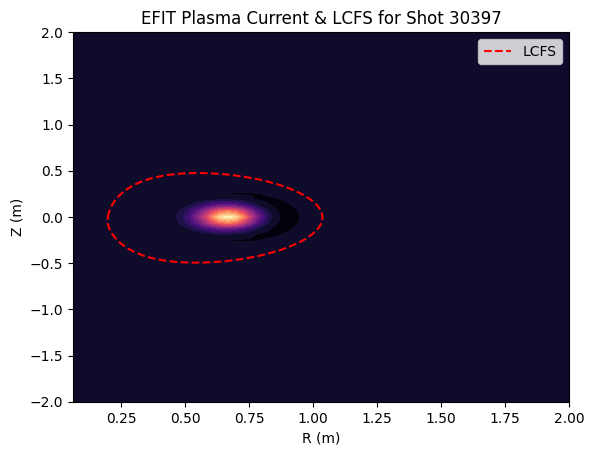

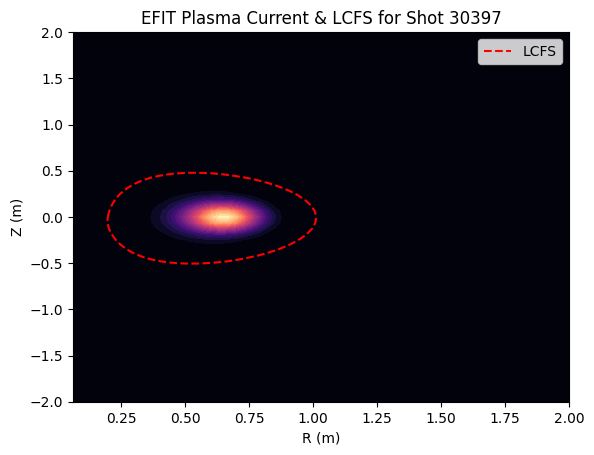

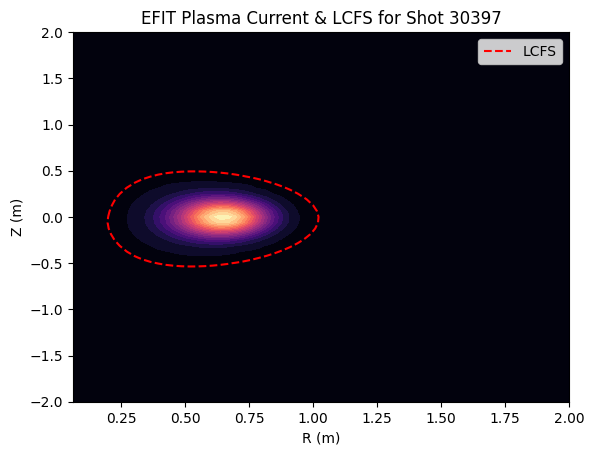

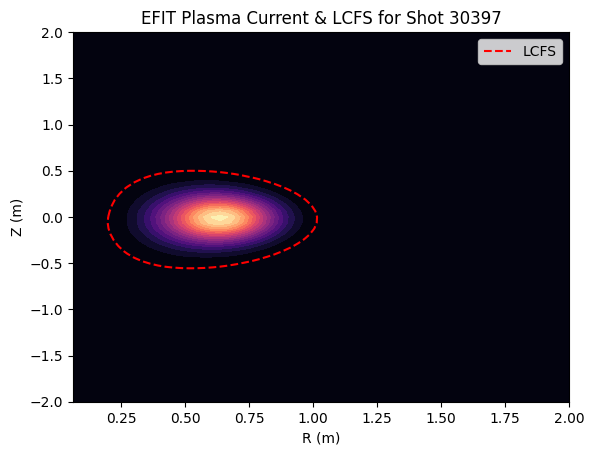

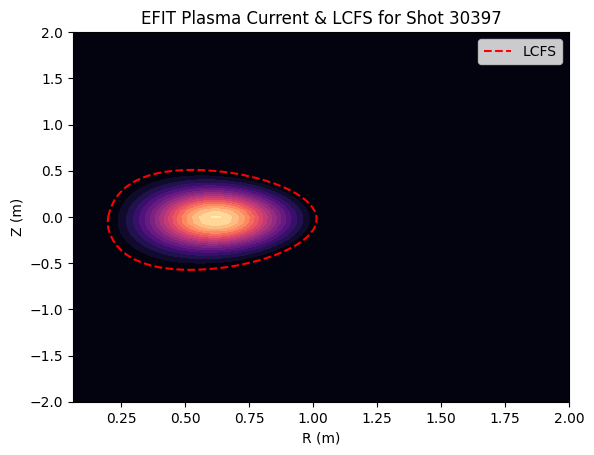

...

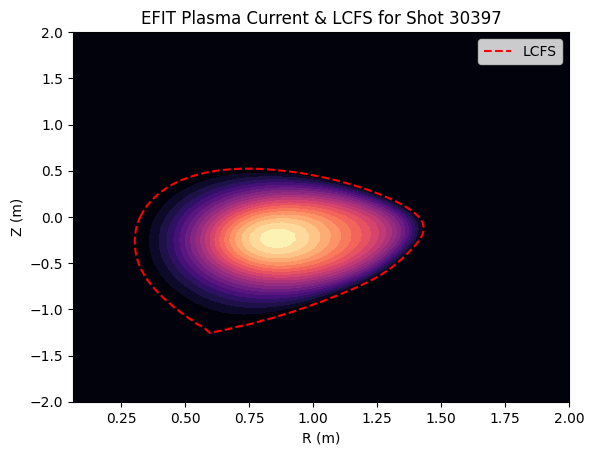

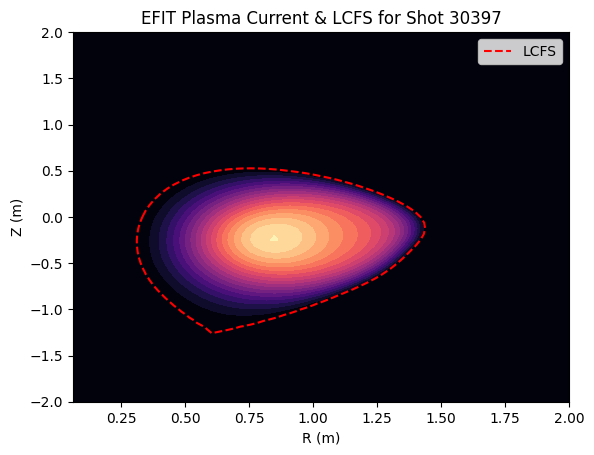

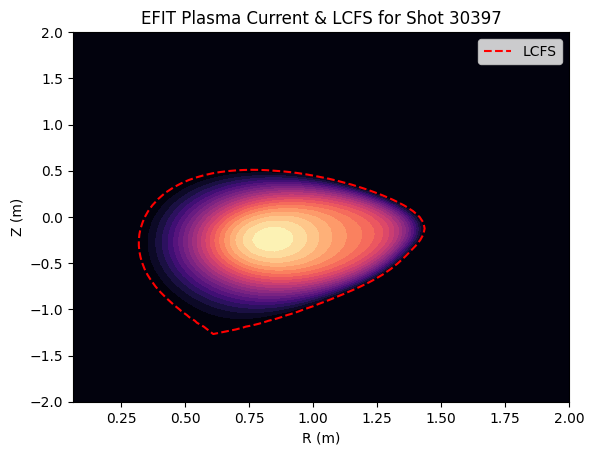

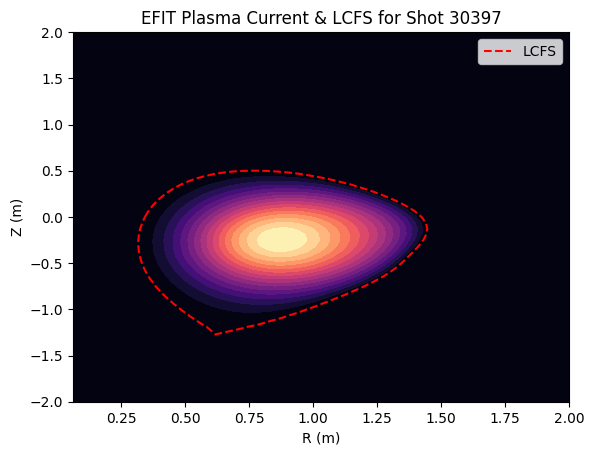

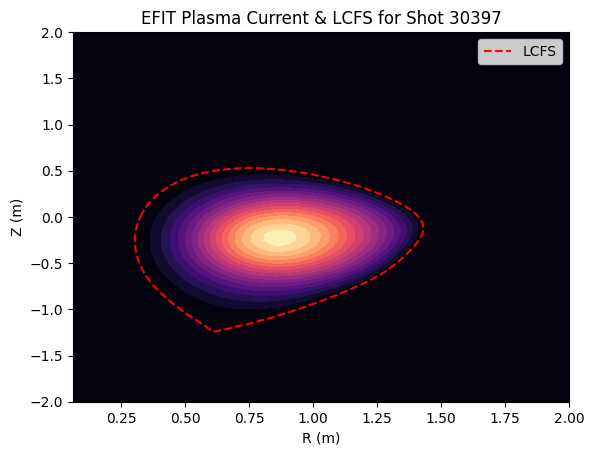

In [113]:
from matplotlib.colors import LogNorm

d = dataset['plasma_current_rz'].dropna(dim='time')
r = dataset['r']
z = dataset['z']

lcfs_R = dataset['lcfs_r'].sel(time=d.time)
lcfs_Z = dataset['lcfs_z'].sel(time=d.time)

R, Z = np.meshgrid(r, z)

def plot_frame(index):
    lcfs_r = lcfs_R[index].values
    lcfs_r = lcfs_r[~np.isnan(lcfs_r)]
    lcfs_z = lcfs_Z[index].values
    lcfs_z = lcfs_z[~np.isnan(lcfs_z)]

    fig, ax = plt.subplots()
    ax.contourf(R, Z, d[index], cmap='magma', levels=20, label='Plasma Current')
    ax.plot(lcfs_r, lcfs_z, c='red', linestyle='--', label='LCFS')

    plt.title(f'EFIT Plasma Current & LCFS for Shot {d.attrs["shot_id"]}')
    plt.ylabel('Z (m)')
    plt.xlabel('R (m)')
    plt.legend()

num_frames = len(d)
file_names = []
for i in range(num_frames):
    plot_frame(i)
    file_name = f'frame_{i}.png'
    plt.savefig(file_name)
    file_names.append(file_name)

gif_filename = 'efit_plasma_current.gif'
with imageio.get_writer(gif_filename, mode='I', duration=0.1, loop=0) as writer:
    for file_name in file_names:
        image = imageio.imread(file_name)
        writer.append_data(image)

for file_name in file_names:
    os.remove(file_name)


### ESM - Needs Review

ibmp1_r_larmor and similar can be dropped if unity.

In [210]:
source = 'esm'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dt = load_source(path)
pipelines = PipelineRegistry()
dataset = pipelines.get(source)(dt)
dataset
# for key, ds in dataset.items():
#     print(key, ds.squeeze().coords)

# df = pd.DataFrame(items)
# df.to_csv('esm.csv')

<xarray.Dataset> Size: 44MB
Dimensions:               (time: 33827, fit_quality_n: 2, radius: 130)
Coordinates:
  * time                  (time) float32 135kB -0.01 -0.00996 ... 1.517 1.517
  * fit_quality_n         (fit_quality_n) float32 8B -999.0 -1e+03
  * radius                (radius) float32 520B 0.0 1.0 2.0 ... 128.0 129.0
Data variables: (12/79)
    area_outin_ratio      (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    av_t                  float32 4B dask.array<chunksize=(), meta=np.ndarray>
    dr_sep_in             (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    dr_sep_out            (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    efm_comb_ratingav     (fit_quality_n) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    efm_comb_ratingmin    (fit_quality_n) float32 8B dask.array<chunksize=(2,), meta=np.ndarray>
    ...                    ...
    v_ion                 float32 4B dask.array<chunksize=(), meta=np.ndarray>
    v_ion_multi           (time, radius) float32 18MB dask.array<chunksize=(33827, 130), meta=np.ndarray>
    v_loop_dynamic        (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    v_loop_static         (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    w_dot                 (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>
    x                     (time) float32 135kB dask.array<chunksize=(33827,), meta=np.ndarray>

### ESX

In [114]:
source = 'esx'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

/tmp/ipykernel_6672/3576158116.py:3: RuntimeWarning: Failed to open Zarr store with consolidated metadata, but successfully read with non-consolidated metadata. This is typically much slower for opening a dataset. To silence this warning, consider:
1. Consolidating metadata in this existing store with zarr.consolidate_metadata().
2. Explicitly setting consolidated=False, to avoid trying to read consolidate metadata, or
3. Explicitly setting consolidated=True, to raise an error in this case instead of falling back to try reading non-consolidated metadata.
  dataset = xr.open_zarr(path)


<xarray.Dataset> Size: 28B
Dimensions:           (time: 1)
Coordinates:
  * time              (time) float32 4B 0.0
Data variables:
    lower_inv_psi     (time) float32 4B dask.array<chunksize=(1,), meta=np.ndarray>
    lower_inv_radius  (time) float32 4B dask.array<chunksize=(1,), meta=np.ndarray>
    passnumber        float32 4B ...
    status            float32 4B ...
    upper_inv_psi     (time) float32 4B dask.array<chunksize=(1,), meta=np.ndarray>
    upper_inv_radius  (time) float32 4B dask.array<chunksize=(1,), meta=np.ndarray>
Attributes:
    description:  EFIT, D. Taylors work
    file_name:    esx0303.97
    format:       IDA3
    mds_name:     None
    name:         esx
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Analysed
    source:       esx
    uda_name:     ESX
    uuid:         53c68369-8879-56c9-8282-440ad7d79101
    version:      0

### RBA

In [115]:
source = 'rba'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'

dataset = xr.open_zarr(path)
make_gif(dataset, file_name)
# plot_gif(file_name)
dataset

<xarray.Dataset> Size: 43MB
Dimensions:  (time: 3490, height: 96, width: 128)
Coordinates:
  * time     (time) float64 28kB 1e-05 0.001343 0.002677 ... 0.294 0.294 0.294
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint8 43MB dask.array<chunksize=(873, 24, 32), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      0.0
    bottom:          616
    camera:          
    ...              ...
    uda_name:        RBA
    uuid:            85b7639d-08e7-5ac8-8b4f-3e6fa7717e4c
    vbin:            0
    version:         -1
    view:            Hl07 floor mount + FFC2 + 25mm lens + CII filter
    width:           128

### RBB

In [116]:
source = 'rbb'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

file_name =f'{source}_animated.gif' 

make_gif(dataset, file_name)
# plot_gif(file_name)
dataset

<xarray.Dataset> Size: 78MB
Dimensions:  (time: 271, height: 448, width: 640)
Coordinates:
  * time     (time) float64 2kB 1.6e-05 0.002016 0.004016 ... 0.293 0.294 0.295
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint8 78MB dask.array<chunksize=(68, 112, 160), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      0.0
    bottom:          680
    camera:          
    ...              ...
    uda_name:        RBB
    uuid:            92011c56-53de-5389-a1ea-2ed0efbb3d61
    vbin:            0
    version:         -1
    view:            photron HM10 + Dalpha filter
    width:           640

### RBC

In [117]:
source = 'rbc'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
file_name =f'{source}_animated.gif' 

make_gif(dataset, file_name)
# plot_gif(file_name)
dataset

<xarray.Dataset> Size: 40MB
Dimensions:  (time: 19, height: 1024, width: 1024)
Coordinates:
  * time     (time) float64 152B 0.01667 0.03334 0.05001 ... 0.2833 0.3 0.3167
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint16 40MB dask.array<chunksize=(5, 256, 256), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      0.0
    bottom:          1024
    camera:          
    ...              ...
    uda_name:        RBC
    uuid:            602ed774-2abd-57fb-a3fb-c7b3c3b59fb0
    vbin:            0
    version:         -1
    view:            HM02; 14mm; CIII 465nm; 6.5mm;
    width:           1024

### RCA

In [118]:
source = 'rca'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

# file_name =f'{source}_animated.gif' 

# make_gif(dataset, file_name)
# plot_gif(file_name)
dataset

<xarray.Dataset> Size: 0B
Dimensions:  ()
Data variables:
    *empty*

### RCO

In [119]:
source = 'rco'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

file_name =f'{source}_animated.gif' 

make_gif(dataset, file_name)
# plot_gif(file_name)
dataset

<xarray.Dataset> Size: 171MB
Dimensions:  (time: 306, height: 364, width: 512, channel: 3)
Coordinates:
  * time     (time) float64 2kB -0.009999 -0.008999 -0.007999 ... 0.294 0.295
Dimensions without coordinates: height, width, channel
Data variables:
    data     (time, height, width, channel) uint8 171MB dask.array<chunksize=(77, 91, 128, 2), meta=np.ndarray>
Attributes: (12/46)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_TRUECOLOR
    IMAGE_VERSION:   1.2
    INTERLACE_MODE:  INTERLACE_PIXEL
    board_temp:      0.0
    bottom:          512
    ...              ...
    uda_name:        RCO
    uuid:            c9ba8074-5a7d-5738-bb26-9a7f6d9ae2b4
    vbin:            0
    version:         -1
    view:            HM11 - normal 
    width:           512

### RGB

In [120]:
source = 'rgb'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

file_name =f'{source}_animated.gif' 

make_gif(dataset, file_name)
# plot_gif(file_name)
dataset


<xarray.Dataset> Size: 61MB
Dimensions:  (time: 99, height: 480, width: 640)
Coordinates:
  * time     (time) float64 792B -0.008983 0.00012 0.009223 ... 0.874 0.8831
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint16 61MB dask.array<chunksize=(25, 120, 160), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      38.5
    bottom:          480
    camera:          IPX-VGA210LCFN      ASSY-0074-0002-RE04 SW v1.63 BL v1.3...
    ...              ...
    uda_name:        RGB
    uuid:            da822845-6b50-5cda-8152-93579dca8c34
    vbin:            0
    version:         -1
    view:            Sector9U
    width:           640

### RGC

In [121]:
source = 'rgc'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

file_name =f'{source}_animated.gif' 

make_gif(dataset, file_name)
# plot_gif(file_name)
dataset


<xarray.Dataset> Size: 114MB
Dimensions:  (time: 186, height: 480, width: 640)
Coordinates:
  * time     (time) float64 1kB -0.01329 -0.008451 -0.003617 ... 0.8763 0.8812
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint16 114MB dask.array<chunksize=(24, 120, 160), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      38.25
    bottom:          480
    camera:          IPX-VGA210LCCN      ASSY-0074-0002-RE04 SW v1.63 BL v1.3...
    ...              ...
    uda_name:        RGC
    uuid:            afba7f61-2408-5bce-b20a-cac704bb9a91
    vbin:            0
    version:         -1
    view:            Sector9U
    width:           640

### RIR

In [122]:
source = 'rir'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)

dataset

<xarray.Dataset> Size: 11MB
Dimensions:  (time: 2221, height: 8, width: 320)
Coordinates:
  * time     (time) float64 18kB -0.04998 -0.04978 -0.04958 ... 0.3938 0.394
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint16 11MB dask.array<chunksize=(556, 4, 160), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      49.5
    bottom:          192
    camera:          SBF125 InSb FPA 320x256 format with SBF1134 4Chan Rev6 (...
    ...              ...
    uda_name:        RIR
    uuid:            0ab1432e-d5be-5989-9eb4-c62fe4446d1b
    vbin:            0
    version:         -1
    view:            Lower divertor view#6
    width:           320

### RIT

In [123]:
source = 'rit'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 6MB
Dimensions:  (time: 371, height: 32, width: 256)
Coordinates:
  * time     (time) float64 3kB -0.04995 -0.04875 -0.04755 ... 0.3928 0.3941
Dimensions without coordinates: height, width
Data variables:
    data     (time, height, width) uint16 6MB dask.array<chunksize=(93, 16, 128), meta=np.ndarray>
Attributes: (12/45)
    CLASS:           IMAGE
    IMAGE_SUBCLASS:  IMAGE_INDEXED
    IMAGE_VERSION:   1.2
    board_temp:      0.0
    bottom:          0
    camera:          Thermosensorik CMT 256 SM HS
    ...              ...
    uda_name:        RIT
    uuid:            39ff8f30-f0a3-5a08-a01a-ad2c06d75cd1
    vbin:            0
    version:         -1
    view:            HL01 Upper divertor view#1
    width:           256

### XDC

In [6]:
source = 'xdc'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 332MB
Dimensions:                   (time: 40000, ai_ccbv_channel: 40,
                               ai_flcc_channel: 10, ai_incon_channel: 10,
                               ai_lhorw_channel: 6, ai_mid_channel: 12,
                               ai_obr_channel: 19, ai_obv_channel: 19,
                               ai_ring_channel: 10, ai_rodgr_channel: 12,
                               ai_uhorw_channel: 6, ai_vertw_channel: 8,
                               ...
                               isoflux_t_seg_td_channel: 13,
                               isoflux_t_seg_ti_channel: 13,
                               isoflux_t_seg_tp_channel: 13,
                               isoflux_t_seg_u_channel: 18,
                               isoflux_t_zpsh_n_channel: 18,
                               isoflux_t_zpsh_p_channel: 18)
Coordinates: (12/14)
  * isoflux_e_seg_channel     (isoflux_e_seg_channel) <U15 780B 'isoflux_e_se...
  * isoflux_t_rpsh_n_channel  (isoflux_t_rpsh_n_channel) <U17 1kB 'isoflux_t_...
  * isoflux_t_rpsh_p_channel  (isoflux_t_rpsh_p_channel) <U17 1kB 'isoflux_t_...
  * isoflux_t_seg_channel     (isoflux_t_seg_channel) <U15 1kB 'isoflux_t_seg...
  * isoflux_t_seg_gd_channel  (isoflux_t_seg_gd_channel) <U17 884B 'isoflux_t...
  * isoflux_t_seg_gi_channel  (isoflux_t_seg_gi_channel) <U17 884B 'isoflux_t...
    ...                        ...
  * isoflux_t_seg_ti_channel  (isoflux_t_seg_ti_channel) <U17 884B 'isoflux_t...
  * isoflux_t_seg_tp_channel  (isoflux_t_seg_tp_channel) <U17 884B 'isoflux_t...
  * isoflux_t_seg_u_channel   (isoflux_t_seg_u_channel) <U16 1kB 'isoflux_t_s...
  * isoflux_t_zpsh_n_channel  (isoflux_t_zpsh_n_channel) <U17 1kB 'isoflux_t_...
  * isoflux_t_zpsh_p_channel  (isoflux_t_zpsh_p_channel) <U17 1kB 'isoflux_t_...
  * time                      (time) float64 320kB -2.0 -2.0 -2.0 ... 2.0 2.0
Dimensions without coordinates: ai_ccbv_channel, ai_flcc_channel,
                                ai_incon_channel, ai_lhorw_channel,
                                ai_mid_channel, ai_obr_channel, ai_obv_channel,
                                ai_ring_channel, ai_rodgr_channel,
                                ai_uhorw_channel, ai_vertw_channel, ai_ccbv,
                                equil_seg_channel
Data variables: (12/996)
    ai_cpu1_botcol            (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    ai_cpu1_camera_ok         (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    ai_cpu1_ccbv              (ai_ccbv_channel, time) float32 6MB dask.array<chunksize=(40, 40000), meta=np.ndarray>
    ai_cpu1_co2               (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    ai_cpu1_endcrown_l        (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    ai_cpu1_endcrown_u        (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    ...                        ...
    z_s_zip                   (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    z_s_zipref                (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    z_t_zdgain                (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    z_t_zpgain                (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    z_t_zref                  (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
    z_t_ztest                 (time) float32 160kB dask.array<chunksize=(40000,), meta=np.ndarray>
Attributes:
    description:  Digital Plasma Control
    file_name:    xdc030397.nc
    format:       CDF
    mds_name:     None
    name:         xdc
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Raw
    source:       xdc
    uda_name:     XDC
    uuid:         a5357c0f-bf9b-5739-bda0-9c61b94fd4c7
    version:      -1

### XMO

In [7]:
source = 'xmo'
path = f'/common/tmp/sjackson/local_cache2/29790.zarr/{source}'
# path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 101MB
Dimensions:                        (dim_0: 16, dim_1: 2, time: 1400000)
Coordinates:
  * dim_0                          (dim_0) int32 64B 0 1 2 3 4 ... 12 13 14 15
  * dim_1                          (dim_1) int32 8B 0 1
  * time                           (time) float64 11MB -0.1 -0.1 ... 0.6 0.6
Data variables: (12/18)
    devices_d3_acq216_025_channel  (dim_0) int32 64B dask.array<chunksize=(16,), meta=np.ndarray>
    devices_d3_acq216_025_range    (dim_0, dim_1) float32 128B dask.array<chunksize=(16, 2), meta=np.ndarray>
    devices_limit                  (dim_0) float64 128B dask.array<chunksize=(16,), meta=np.ndarray>
    omaha_1lz                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_2lt                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_2lz                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    ...                             ...
    omaha_5lz                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_5ur                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_5ut                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_5uz                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    omaha_6lz                      (time) float32 6MB dask.array<chunksize=(1400000,), meta=np.ndarray>
    time1                          (time) float64 11MB dask.array<chunksize=(1400000,), meta=np.ndarray>
Attributes:
    description:  Magnetic Field Measurements: OMAHA high frequency Mirnov co...
    file_name:    xmo029790.nc
    format:       CDF
    mds_name:     None
    name:         xmo
    quality:      Not Checked
    shot_id:      29790
    signal_type:  Raw
    source:       xmo
    uda_name:     XMO
    uuid:         ff541ac3-6b1c-5373-8d33-b85fd46bc75b
    version:      -1

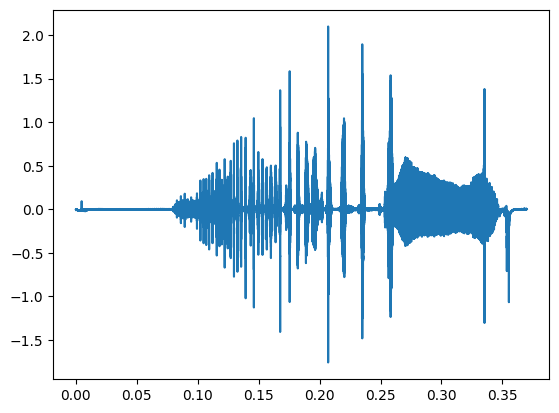

In [8]:
ds = dataset['omaha_3lz']
ds = ds.isel(time=(ds.time > 0) & (ds.time < .37))
plt.plot(ds.time, ds)

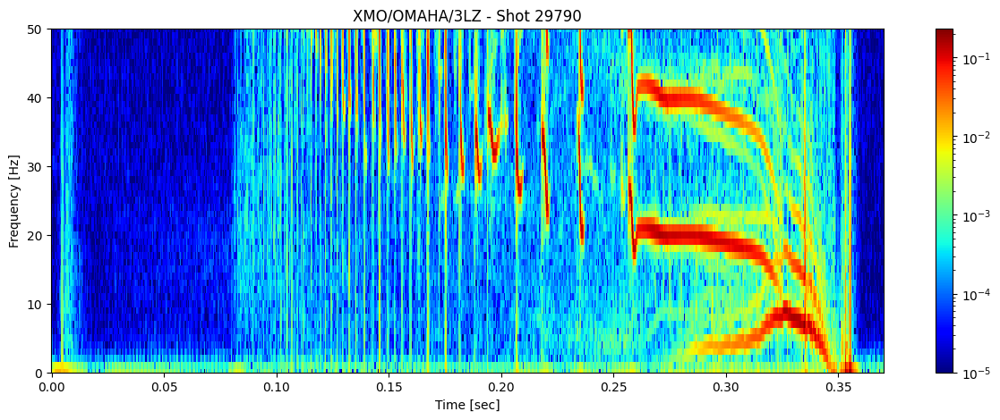

In [9]:
import numpy as np
from scipy.signal import stft
from matplotlib.colors import LogNorm

# Parameters to limit the number of frequencies
nperseg = 2000  # Number of points per segment
nfft = 2000  # Number of FFT points

# Compute the Short-Time Fourier Transform (STFT)
sample_rate = 1/(ds.time[1] - ds.time[0])
f, t, Zxx = stft(ds, fs=int(sample_rate), nperseg=nperseg, nfft=nfft)

fig, ax = plt.subplots(figsize=(15, 5))
cax = ax.pcolormesh(t, f/1000, np.abs(Zxx), shading='nearest', cmap='jet', norm=LogNorm(vmin=1e-5))
ax.set_ylim(0, 50)
ax.set_title(f'XMO/OMAHA/3LZ - Shot {ds.attrs["shot_id"]}')
ax.set_ylabel('Frequency [Hz]')
ax.set_xlabel('Time [sec]')
plt.colorbar(cax, ax=ax)

### XPC

In [10]:
source = 'xpc'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 40MB
Dimensions:           (time: 134750)
Coordinates:
  * time              (time) float32 539kB -0.1 -0.1 -0.09999 ... 1.499 1.5 1.5
Data variables: (12/74)
    a14_0116#06       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    a14_0118#03       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    a14_0118#06       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    chfs_drive        (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    clamp_p1_drive    (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    clamp_p2_drive    (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    ...                ...
    trcf_0104_16      (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    trcf_0104_5       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    trcf_0104_6       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    trcf_0104_9       (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    z_d_f_b           (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
    zip_velocity      (time) float32 539kB dask.array<chunksize=(134750,), meta=np.ndarray>
Attributes:
    description:  Datac system. Monitoring what goes in/out PCS
    file_name:    xpc0303.97
    format:       IDA3
    mds_name:     None
    name:         xpc
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Raw
    source:       xpc
    uda_name:     XPC
    uuid:         0f5f284a-39b5-526e-8205-7862aac45ecf
    version:      -1

### XSX

In [14]:
source = 'xsx'
path = f'/common/tmp/sjackson/local_cache2/30397.zarr/{source}'
dataset = xr.open_zarr(path)
dataset

<xarray.Dataset> Size: 138MB
Dimensions:                          (time: 300000, dim_0: 96, dim_1: 2,
                                      hcam_l_channel: 36, hcam_u_channel: 36,
                                      tcam_channel: 36)
Coordinates:
  * dim_0                            (dim_0) int32 384B 0 1 2 3 ... 92 93 94 95
  * dim_1                            (dim_1) int32 8B 0 1
  * hcam_l_channel                   (hcam_l_channel) <U21 3kB '0' ... 'hcam_...
  * hcam_u_channel                   (hcam_u_channel) <U21 3kB '0' ... 'hcam_...
  * tcam_channel                     (tcam_channel) <U21 3kB '0' ... 'tcam_9'
  * time                             (time) float64 2MB -0.009999 ... 0.59
Data variables: (12/30)
    acq196_061_ch01                  (time) float32 1MB dask.array<chunksize=(300000,), meta=np.ndarray>
    acq196_147_96                    (time) float32 1MB dask.array<chunksize=(300000,), meta=np.ndarray>
    devices_d112_acq196_061_channel  (dim_0) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    devices_d112_acq196_061_range    (dim_0, dim_1) float32 768B dask.array<chunksize=(96, 2), meta=np.ndarray>
    devices_d2_acq196_147_channel    (dim_0) int32 384B dask.array<chunksize=(96,), meta=np.ndarray>
    devices_d2_acq196_147_range      (dim_0, dim_1) float32 768B dask.array<chunksize=(96, 2), meta=np.ndarray>
    ...                               ...
    tcam_r1                          (tcam_channel) float64 288B dask.array<chunksize=(36,), meta=np.ndarray>
    tcam_r2                          (tcam_channel) float64 288B dask.array<chunksize=(36,), meta=np.ndarray>
    tcam_theta_rad                   (tcam_channel) float64 288B dask.array<chunksize=(36,), meta=np.ndarray>
    tcam_z1                          (tcam_channel) float64 288B dask.array<chunksize=(36,), meta=np.ndarray>
    tcam_z2                          (tcam_channel) float64 288B dask.array<chunksize=(36,), meta=np.ndarray>
    time1                            (time) float64 2MB dask.array<chunksize=(300000,), meta=np.ndarray>
Attributes:
    description:  SRX Camera
    file_name:    xsx030397.nc
    format:       CDF
    mds_name:     None
    name:         xsx
    quality:      Not Checked
    shot_id:      30397
    signal_type:  Raw
    source:       xsx
    uda_name:     XSX
    uuid:         3b231f73-f0b9-564c-84cf-937d28d42d46
    version:      -1